In [1]:
cd ../DeepHis2Exp/Dataset/

/afm01/UQ/Q2051/DeepHis2Exp/Dataset


In [2]:
ls

Alex_NatGen_6BreastCancer/  cache/      her2st/     SCC_Visium_4samples/
breast_cancer_10x_visium/   GSE213688/  hvg_lists/


# Alex and 10X Visium BC Dataset

In [3]:
from typing import Union, Dict, Optional, Tuple, BinaryIO
from pathlib import Path, PurePath
from scanpy import read_visium, read_10x_mtx
from matplotlib.image import imread
import anndata as ad
import json
import pandas as pd
import numpy as np
import scanpy as sc
import gc


In [4]:
def read_visium_10x(
    path: Union[str, Path],
    genome: Optional[str] = None,
    *,
    count_dir: str = "filtered_feature_bc_matrix",
    library_id: str = None,
    load_images: Optional[bool] = True,
    source_image_path: Optional[Union[str, Path]] = None,) -> ad.AnnData:
    path = Path(path)
    adata = read_10x_mtx(str(path)+'/'+count_dir)

    # from h5py import File
    adata.uns["spatial"] = dict()
    adata.uns["spatial"][library_id] = dict()
    if load_images:
        files = dict(
            tissue_positions_file=path / 'spatial/tissue_positions_list.csv',
            scalefactors_json_file=path / 'spatial/scalefactors_json.json',
            hires_image=path / 'spatial/tissue_hires_image.png',
            lowres_image=path / 'spatial/tissue_lowres_image.png',
        )
        # Check if files exists, continue if images are missing
        for f in files.values():
            if not f.exists():
                if any(x in str(f) for x in ["hires_image", "lowres_image"]):
                    logg.warning(
                        f"You seem to be missing an image file.\n"
                        f"Could not find '{f}'." )
                else:
                    raise OSError(f"Could not find '{f}'")

        adata.uns["spatial"][library_id]['images'] = dict()
        for res in ['hires', 'lowres']:
            try:
                adata.uns["spatial"][library_id]['images'][res] = imread(
                    str(files[f'{res}_image']))
            except Exception:
                raise OSError(f"Could not find '{res}_image'")

        # read json scalefactors
        adata.uns["spatial"][library_id]['scalefactors'] = json.loads(
            files['scalefactors_json_file'].read_bytes() )
        adata.uns["spatial"][library_id]["metadata"] = {}

        # read coordinates
        positions = pd.read_csv(files['tissue_positions_file'], header=None)
        positions.columns = [
                            'barcode',
                            'in_tissue',
                            'array_row',
                            'array_col',
                            'pxl_col_in_fullres',
                            'pxl_row_in_fullres', ]
        positions.index = positions['barcode']
        adata.obs = adata.obs.join(positions, how="left")
        adata.obsm['spatial'] = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']].to_numpy()
        adata.obs.drop(columns=['barcode', 'pxl_row_in_fullres', 'pxl_col_in_fullres'], inplace=True,)
        # Add image path in uns
        if source_image_path is not None:
            # Get an absolute path
            source_image_path = str(Path(source_image_path).resolve())
            adata.uns["spatial"][library_id]["metadata"]["source_image_path"] = str(source_image_path)
            
    return adata

In [87]:
def read_visium_Alex(
    path: Union[str, Path],
    genome: Optional[str] = None,
    *,
    count_dir: str = "raw_feature_bc_matrix",
    library_id: str = None,
    load_images: Optional[bool] = True,
    source_image_path: Optional[Union[str, Path]] = None,) -> ad.AnnData:
    path = Path(path)
    adata = read_10x_mtx(str(path)+'/'+count_dir)
    
    import squidpy as sq

    # from h5py import File
    adata.uns["spatial"] = dict()
    adata.uns["spatial"][library_id] = dict()
    if load_images:
        files = dict(
            tissue_positions_file=path / 'spatial/tissue_positions_list.csv',
            scalefactors_json_file=path / 'spatial/scalefactors_json.json',
            hires_image=path / 'spatial/tissue_hires_image.png',
            lowres_image=path / 'spatial/tissue_lowres_image.png',
        )
        # Check if files exists, continue if images are missing
        for f in files.values():
            if not f.exists():
                if any(x in str(f) for x in ["hires_image", "lowres_image"]):
                    logg.warning(
                        f"You seem to be missing an image file.\n"
                        f"Could not find '{f}'." )
                else:
                    raise OSError(f"Could not find '{f}'")

        adata.uns["spatial"][library_id]['images'] = dict()
        for res in ['hires', 'lowres']:
            try:
                adata.uns["spatial"][library_id]['images'][res] = imread(
                    str(files[f'{res}_image']))
            except Exception:
                raise OSError(f"Could not find '{res}_image'")

        # read json scalefactors
        adata.uns["spatial"][library_id]['scalefactors'] = json.loads(
            files['scalefactors_json_file'].read_bytes() )
        adata.uns["spatial"][library_id]["metadata"] = {}

        # read coordinates
        positions = pd.read_csv(files['tissue_positions_file'], header=None)
        positions.columns = [
                            'barcode',
                            'in_tissue',
                            'array_row',
                            'array_col',
                            'pxl_col_in_fullres',
                            'pxl_row_in_fullres', ]
        positions.index = positions['barcode']
        adata.obs = adata.obs.join(positions, how="left")
        adata.obsm['spatial'] = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']].to_numpy()
        adata.obs.drop(columns=['barcode', 'pxl_row_in_fullres', 'pxl_col_in_fullres'], inplace=True,)
        # Add image path in uns
        if source_image_path is not None:
            # Get an absolute path
            source_image_path = str(Path(source_image_path).resolve())
            adata.uns["spatial"][library_id]["metadata"]["source_image_path"] = str(source_image_path)
        # Add pathology annoatation
        df = pd.read_csv(f"{path}/metadata.csv", index_col=[0]).dropna()
        label_mapping = {
        'Invasive cancer + stroma + lymphocytes': 'Invasive Cancer',
        'Invasive cancer + stroma': 'Invasive Cancer',
        'Stroma': 'Stroma',
        'Invasive cancer + lymphocytes': 'Invasive Cancer',
        'Necrosis': 'Other',
        'Invasive cancer': 'Invasive Cancer',
        'Lymphocytes': 'Lymphocyte',
        'DCIS': 'Normal',
        'Normal glands + lymphocytes': 'Lymphocyte',
        'Normal + stroma + lymphocytes': 'Lymphocyte',
        'Artefact': 'Other',
        'Stroma + adipose tissue': 'Stroma',
        'Adipose tissue': 'Stroma',
        'Uncertain': 'Other',
        'TLS': 'Other',
        'Cancer trapped in lymphocyte aggregation': 'Lymphocyte',
        'Invasive cancer + adipose tissue + lymphocytes': 'Invasive Cancer',
        'Normal duct': 'Normal'
    }
        df['Grouped annotations'] = df['Classification'].map(label_mapping)
        df = df[df["Grouped annotations"]!="Other"]
        adata = adata[adata.obs.join(df, how="right").dropna().index,]
        adata.obs = adata.obs.join(df, how="right")
        sq.pl.spatial_scatter(adata, color="Grouped annotations")
        
    return adata

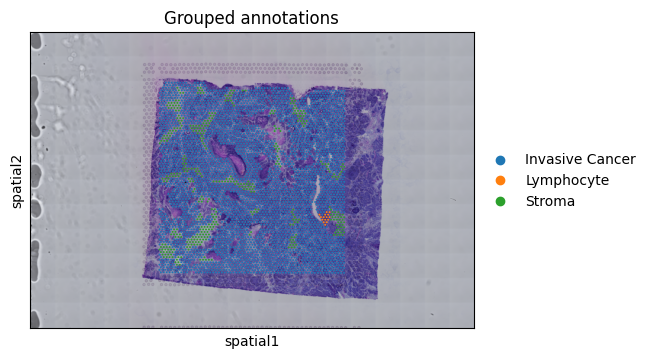

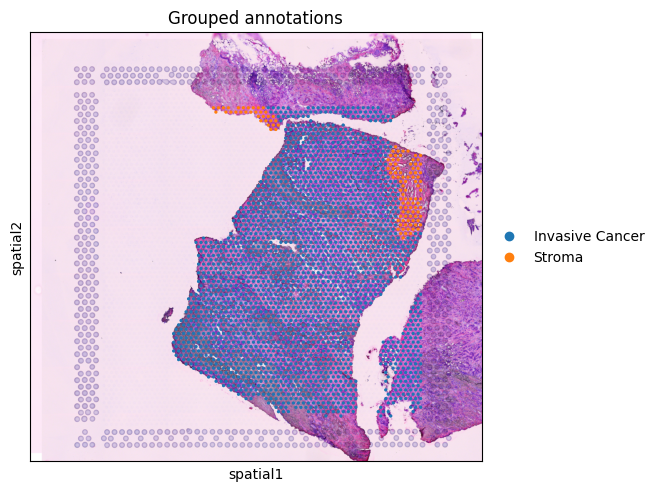

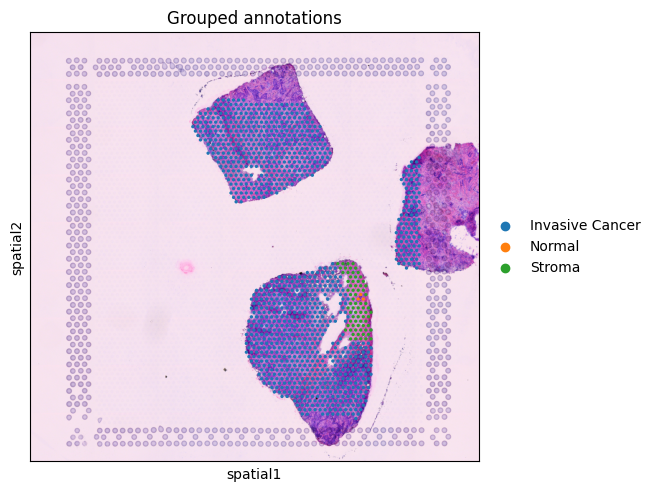

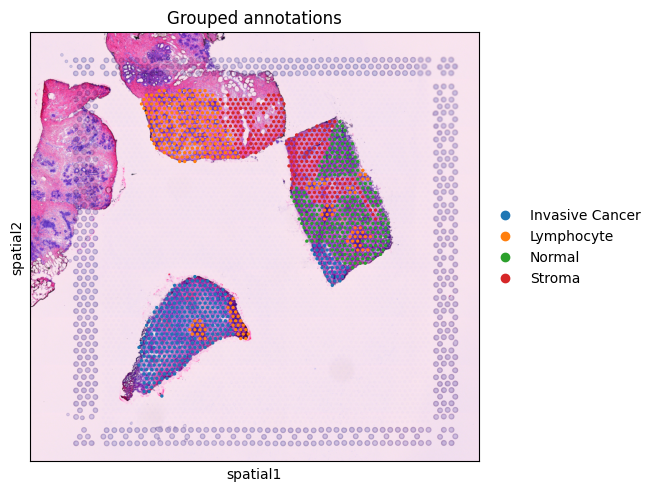

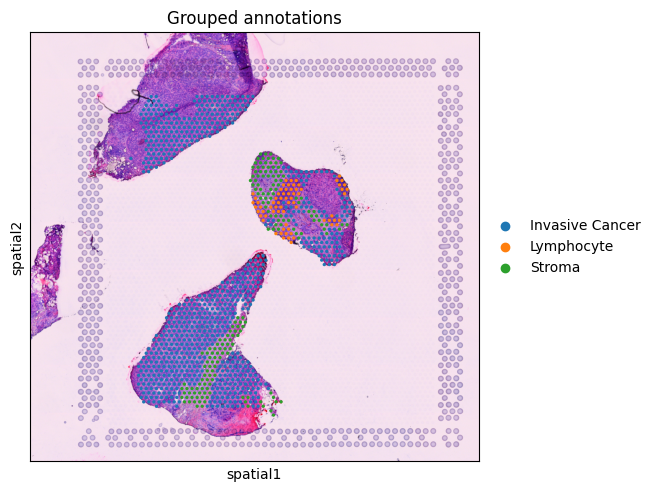

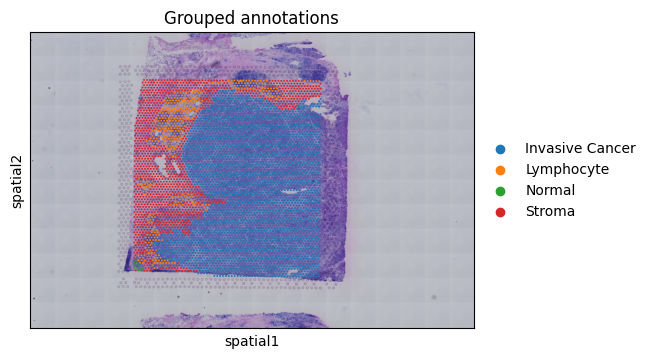

In [88]:
# Dataset path
data_dir1 = "./Alex_NatGen_6BreastCancer/"
data_dir2 = "./breast_cancer_10x_visium/"
# Sample names
samps1 = ["1142243F", "CID4290", "CID4465", "CID44971", "CID4535", "1160920F"]

samps2 = ["block1", "block2", "FFPE"]
# Store sample's path into dictionary
samples1 = {i:data_dir1 + i for i in samps1}
samples2 = {i:data_dir2 + i for i in samps2}
# Read the adata from the path dictionary and create a dictionary to save the adata.
adata_dict1 = {name: read_visium_Alex(path, library_id = name, 
                                     source_image_path = path + f"/image.tif") for name, path in samples1.items()}

# adata_dict2 = {name: read_visium_10x(path, library_id = name, 
#                                      source_image_path = path + f"/image.tif") for name, path in samples2.items()}


# Graph Construction

In [162]:
import scipy.sparse as sp
import sklearn
import torch
import networkx as nx
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.neighbors import kneighbors_graph
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import h5py
from scipy.sparse import csr_matrix
from sklearn.metrics.pairwise import euclidean_distances

In [163]:
# Build graph using pathology annotations (PAG)
def pathology_annotation_graph(labels, alpha=1e-10):
    """
    Input: List of cell types(pathology annotations)
    Output: Adjancent matrix
    Rule: Same category or not (1 or a near 0 value)
    """
    import numpy as np
    import torch
    import tqdm
    
    # Initialize an empty graph as a 2D list filled with zeros
    graph = [[alpha for _ in range(len(labels))] for _ in range(len(labels))]
    
    # Iterate through each pair of labels
    for i in tqdm.tqdm(range(len(labels))):
      for j in range(i + 1, len(labels)):
          # Check if the labels are the same
          if labels[i] == labels[j]:
              graph[i][j] = 1
              graph[j][i] = 1 
    graph = torch.tensor(graph)
    return graph

In [164]:
# Build graph using spatial coordinates (SLG)
def spatial_construct_graph(positions, k=4, mode="distance"):
    """
    Input: 
    positions=>Spatial coordinates, 
    k=>number of nearest neighbours, 
    mode=>return adjancent matrix or distance matrix
    Output:
    graph: adjancent matrix or distance matrix

    Test code:
    ct = torch.randint(0, 40000, (6, 2)).to(torch.float32).long() # 0-40000 is range of whole slide image pixels, 6 is num_cell, 2 is spatial coordinates.
    spatial_construct_graph(ct, k=0, weights=calcWeights(exp).numpy()) # return an adjancency matrix
    """
    from sklearn.neighbors import kneighbors_graph
    import torch
    
    print("start spatial construct graph")
    k = positions.shape[0]-1 if k == 0 else k
    print("k: ", k)
    A = kneighbors_graph(positions, k, mode=mode, include_self=True).toarray()
    return torch.tensor(A)


In [165]:
# Build graph using patch image or gene expression similarity (HSG)
# Dimension reduction by pca
def PCA_process(X, nps):
    from sklearn.decomposition import PCA
    print('Shape of data to PCA:', X.shape)
    pca = PCA(n_components=nps)
    X_PC = pca.fit_transform(X)     # It is same as pca.fit(X) pca.transform(X)
    print('Shape of data output by PCA:', X_PC.shape)
    print('PCA recover:', pca.explained_variance_ratio_.sum())
    return X_PC
    
def features_construct_graph(features, k=4, pca=None, mode="connectivity", metric="cosine"):
    """
    Calculate histological similarity graph directly use patch image(cell/spot level) similarity.
    The weight is from gene expression similarity between cells.
    k is the number of nearest nodes, if k=0 we consider all nodes.
    if mode = connectivity, it will return adjancent matrix.
    if mode = distance, it will return disatnce matrix.

    Test codes:
    img_features = torch.randn(10, 512) # 10 is number of cells, 512 is the dimension of image embeddings
    exp_features = torch.randn(10, 300) # 10 is number of cells, 300 is the dimension of gene expression
    HSG = features_construct_graph(img_features, k=0)
    GAG = features_construct_graph(exp_features, k=0)
    """
    print("start features construct graph")
    if pca is not None:
        features = PCA_process(features, nps=pca)
    k = features.shape[0]-1 if k == 0 else k
    print("k: ", k)
    print("features_construct_graph features", features.shape)
    A = kneighbors_graph(features, k + 1, mode=mode, metric=metric, include_self=True)
    A = A.toarray()
    row, col = np.diag_indices_from(A)
    A[row, col] = 0
    fadj = sp.coo_matrix(A, dtype=np.float32)
    fadj = fadj + fadj.T.multiply(fadj.T > fadj) - fadj.multiply(fadj.T > fadj)
    fadj = torch.tensor(fadj.toarray())
    return fadj #, nfadj


In [166]:
positions = adata_dict1["1142243F"].obsm["spatial"]
pathology_annotation = list(adata_dict1["1142243F"].obs["Grouped annotations"])
gene_exp = adata_dict1["1142243F"].to_df()


In [170]:
SLG = spatial_construct_graph(positions, k=8, mode="distance")
PAG = pathology_annotation_graph(pathology_annotation)
GAG = features_construct_graph(np.array(gene_exp.values), pca=50, mode="distance", k=4) # Contruct Gene expression similarity graph (distance matrix)
weighted_graph = PAG*GAG*SLG
print(f"Pathology annotations graph:\n{PAG}\nSpatial location graph:\n{SLG}, Gene expression association graph:\n{GAG}\nWeighted_graph=PAG*GAG*SLG\n:{weighted_graph}")



start spatial construct graph
k:  8


100%|███████████████████████████████████████████████████████████████████████████████████████| 4087/4087 [00:00<00:00, 4296.27it/s]


start features construct graph
Shape of data to PCA: (4087, 36601)
Shape of data output by PCA: (4087, 50)
PCA recover: 0.76688194
k:  4
features_construct_graph features (4087, 50)
Pathology annotations graph:
tensor([[1.0000e-10, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 1.0000e+00,
         1.0000e+00],
        [1.0000e+00, 1.0000e-10, 1.0000e+00,  ..., 1.0000e+00, 1.0000e+00,
         1.0000e+00],
        [1.0000e+00, 1.0000e+00, 1.0000e-10,  ..., 1.0000e+00, 1.0000e+00,
         1.0000e+00],
        ...,
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e-10, 1.0000e+00,
         1.0000e+00],
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 1.0000e-10,
         1.0000e+00],
        [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00, 1.0000e+00,
         1.0000e-10]])
Spatial location graph:
tensor([[  0.0000, 272.8828, 272.0018,  ...,   0.0000,   0.0000,   0.0000],
        [272.8828,   0.0000, 272.7526,  ...,   0.0000,   0.0000,   0.0000],
        [272.0018

In [32]:
for key in list(adata_dict1.keys()):
    top1k_hvg = detect_hvg(adata_dict1[key], 1000)
    text_save(top1k_hvg, f"{key}_hvg_list.txt", )


/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)


In [35]:
for key in list(adata_dict2.keys()):
    top1k_hvg = detect_hvg(adata_dict2[key], 1000)
    text_save(top1k_hvg, f"{key}_hvg_list.txt", )


In [38]:
for key in list(adata_dict3.keys()):
    top1k_hvg = detect_hvg(adata_dict3[key], 1000)
    text_save(top1k_hvg, f"{key}_hvg_list.txt", )


In [51]:
for key in list(adata_dict4.keys()):
    top1k_hvg = detect_hvg(adata_dict4[key], 1000)
    text_save(top1k_hvg, f"{key}_hvg_list.txt", )


/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)


In [52]:
for key in list(adata_dict5.keys()):
    top1k_hvg = detect_hvg(adata_dict5[key], 1000)
    text_save(top1k_hvg, f"{key}_hvg_list.txt", )


/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:124: RuntimeWarning: invalid value encountered in divide
  residuals = (X_dense - mu) / np.sqrt(mu + mu**2 / theta)
/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scanpy/experimental/pp/_highly_variable_genes

In [57]:
len(os.listdir())

60

In [105]:
# Reference: https://www.sc-best-practices.org/spatial/spatially_variable_genes.html
# !pip install NaiveDE
# !pip install SpatialDE
def detect_svg(adata, n_top_genes=1000, method = "moran", visualize_top5svg=True):
    import scanpy as sc
    import squidpy as sq
    import NaiveDE
    import SpatialDE
    import gc
    
    sc.settings.verbosity = 3
    sc.settings.set_figure_params(dpi=80, facecolor="white")
    if method =="moran":
        sq.gr.spatial_neighbors(adata)
        sq.gr.spatial_autocorr(adata, mode="moran", genes=adata.var_names)
        # I so the Moran’s I,
        # pval_norm a p-value under normality assumption.
        # var_norm the variance of the Moran’s I under normality assumption.
        # {p_val}_{corr_method} the corrected p-values.
        top_svg = list(adata.uns["moranI"].index)[:n_top_genes]
    
    elif method =="SpatialDE":
        sq.gr.spatial_neighbors(adata)
        adata.var_names_make_unique()
        counts = sc.get.obs_df(adata, keys=list(adata.var_names), use_raw=False)
        total_counts = sc.get.obs_df(adata, keys=["total_counts"])
        norm_expr = NaiveDE.stabilize(counts.T).T
        resid_expr = NaiveDE.regress_out(total_counts, norm_expr.T, "np.log(total_counts)").T
        results = SpatialDE.run(adata.obsm["spatial"], resid_expr)
        top_svg = list(results.sort_values("qval").head(n_top_genes)["g"])
        
    if visualize_top5svg:
        sq.pl.spatial_scatter(adata, color=top_svg[:5])
    gc.collect()
    return top_svg

Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)
Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)
Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['m

['CST3',
 'IFI27',
 'CFL1',
 'KRT19',
 'EEF1G',
 'STC2',
 'RPS2',
 'STARD10',
 'PPDPF',
 'RPS11',
 'RPS4X',
 'SLC39A6',
 'COX6C',
 'RPL10',
 'RPL8',
 'HSPB1',
 'SLC9A3R1',
 'LGALS3BP',
 'AFDN',
 'RPL36',
 'IFI6',
 'ZNF703',
 'H2AFJ',
 'DDX5',
 'MIF',
 'MGP',
 'RPL28',
 'NEAT1',
 'EEF1A1',
 'MAGED2',
 'TAPBP',
 'FAU',
 'RPS19',
 'RPL19',
 'UBA52',
 'RPLP1',
 'RPS3A',
 'RACK1',
 'CCND1',
 'RPL31',
 'CRIP1',
 'RPL37A',
 'SNHG25',
 'DHRS2',
 'TSPAN13',
 'RPL18A',
 'RPL23',
 'SDC4',
 'AHNAK',
 'RPL3',
 'RPS15',
 'RPL38',
 'RPL29',
 'P4HB',
 'TPT1',
 'SERF2',
 'RPS18',
 'IL6ST',
 'RPL18',
 'RPL13',
 'GAPDH',
 'NORAD',
 'BMPR1B',
 'GLUL',
 'TMSB10',
 'RPL13A',
 'H3F3B',
 'RPL27A',
 'RPLP2',
 'RPLP0',
 'RPS6',
 'HNRNPA1',
 'COX6A1',
 'CANX',
 'RPS3',
 'GPX4',
 'RPL39',
 'RPS14',
 'RPL7',
 'GNAS',
 'PTMA',
 'ANPEP',
 'RPS9',
 'HLA-B',
 'RPL9',
 'GJA1',
 'RPL30',
 'PRDX1',
 'IER3',
 'TIMP3',
 'UBB',
 'RPL7A',
 'EIF1',
 'RPS8',
 'UBC',
 'TMBIM6',
 'EEF2',
 'RPS17',
 'KRT18',
 'FTH1',
 'EEF1D',
 '

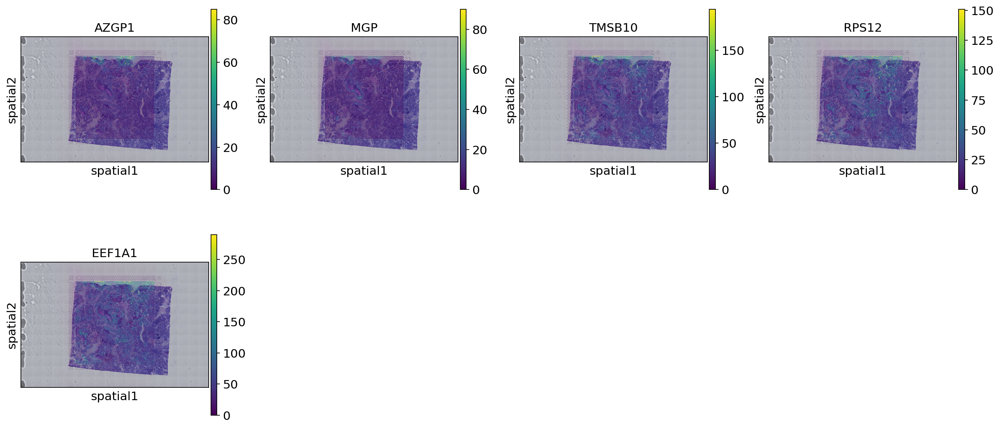

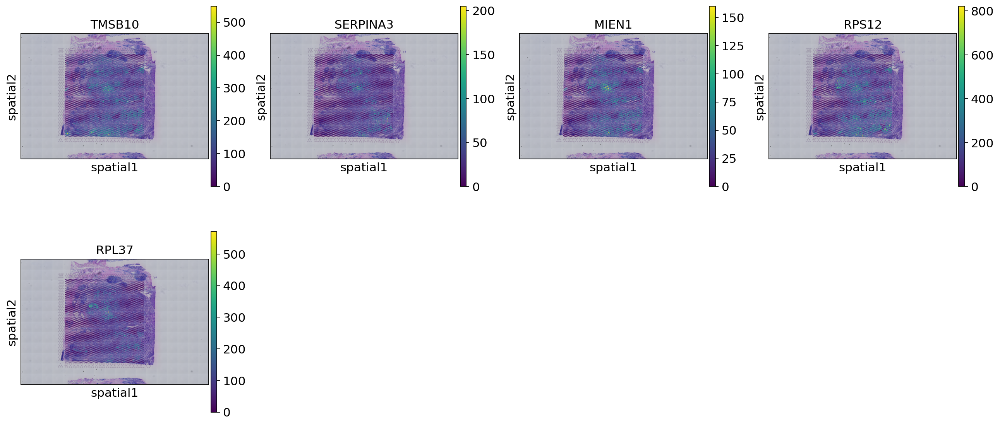

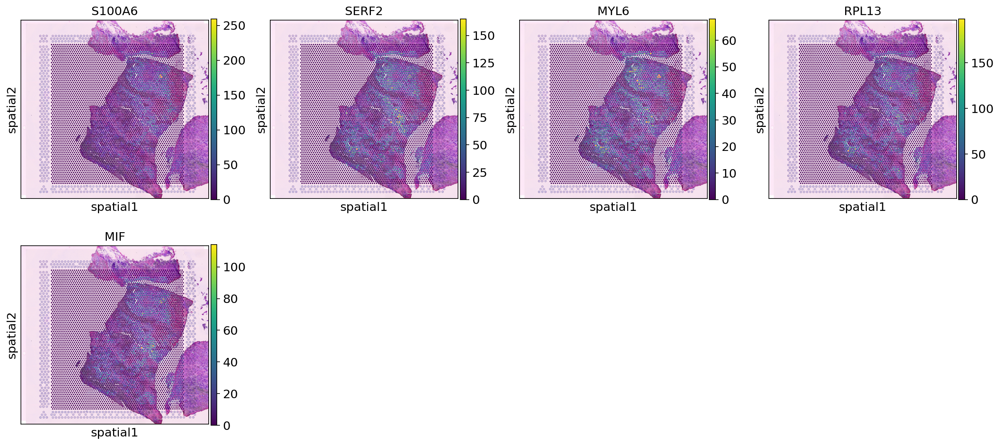

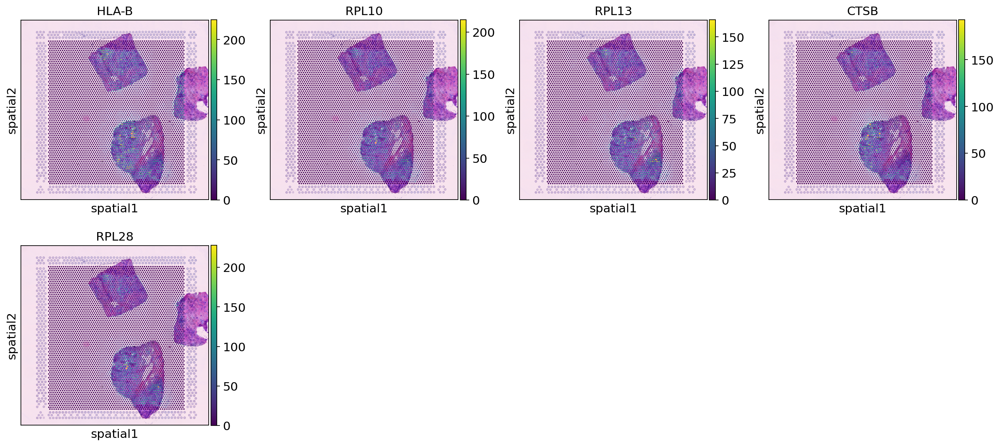

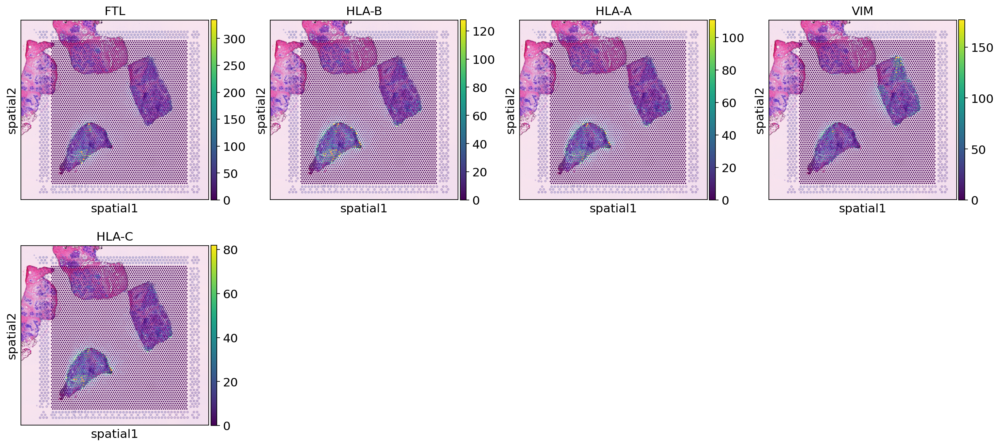

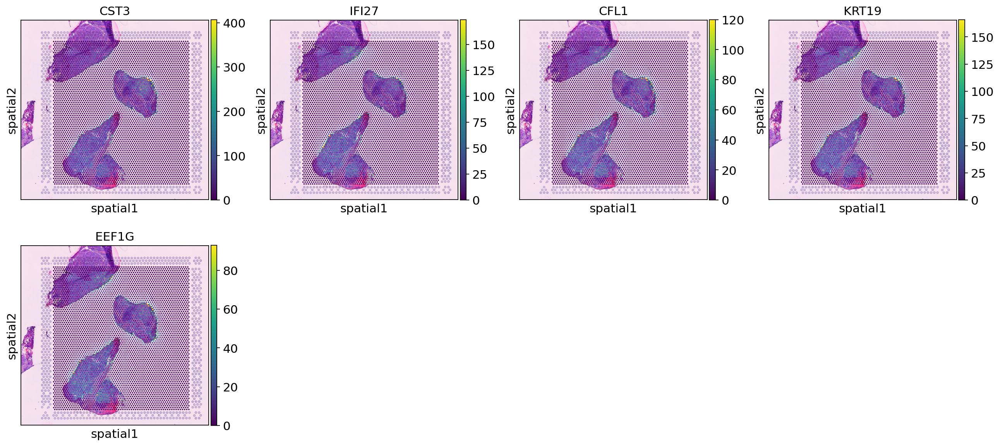

In [107]:
for key in list(adata_dict1.keys()):
    top_svg = detect_svg(adata_dict1[key], n_top_genes=1000, method = "moran",)
    text_save(top_svg, f"{key}_moran_svg_list.txt", )
top_svg

In [109]:
for key in list(adata_dict1.keys()):
    top_svg = detect_svg(adata_dict1[key], n_top_genes=1000, method = "SpatialDE",)
    text_save(top_svg, f"{key}_SpatialDE_svg_list.txt", )
top_svg

Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)


/opt/anaconda3/envs/torch2py38/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
 77%|███████████████████████████████████████████████████████████████████▏                   | 18605/24097 [03:33<00:58, 93.14it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)


 94%|█████████████████████████████████████████████████████████████████████████████████▋     | 22764/24230 [04:15<00:16, 90.00it/s]/home/uqxjin3/.local/lib/python3.8/site-packages/SpatialDE/base.py:178: RuntimeWarning: divide by zero encountered in scalar divide
  s2_logdelta = 1. / (derivative(LL_obj, np.log(max_del

In [111]:
ls

1142243F.h5ad                    CID4290_moran_svg_list.txt
1142243F_hvg_list.txt            CID4465.h5ad
1142243F_moran_svg_list.txt      CID4465_hvg_list.txt
1142243F_SpatialDE_svg_list.txt  CID4465_moran_svg_list.txt
1160920F.h5ad                    CID44971.h5ad
1160920F_hvg_list.txt            CID44971_hvg_list.txt
1160920F_moran_svg_list.txt      CID44971_moran_svg_list.txt
1160920F_SpatialDE_svg_list.txt  CID4535.h5ad
CID4290.h5ad                     CID4535_hvg_list.txt
CID4290_hvg_list.txt             CID4535_moran_svg_list.txt
